# Introduction and Analysis with MIIT

This notebook serves as an introduction and tutorial into the MIIT framework and how to integrate several spatial omcis techniques as well to showcase the analysis steps that were done in the paper "Spatial Integration of Multi-Omics Data from Serial Sections using the novel Multi-Omics Imaging Integration Toolset".

Although the focus of the publication is the spatial integration of spatial transcriptomics (Visium arrays; ST) data and mass spectrometry imaging by MALDI-TOF MSI (MSI), MIIT supports a variety of other types of spatial data. This notebook is written to be very verbose to include some of those additional data types as they were part of integration performed in the article.

A shorter, more concise notebook can be found in "06_reviewer_notebook_short.ipynb". 

This notebook is designed such that at the end of each section, the result is saved to file and reloaded at the beginning of the next chapter. By doing so, each chapter can be executed independently (after the initial execution). Also note, that some of the steps in the notebook are alternative ways of getting to the same result. Therefore, these steps do not all need to be executed (but we mention that further down). Still, the notebook can be executed top-down (just some operations will be carried out twice.)

### Note on the test data:

To run this notebook we provided a reduced minimal test dataset on Zenodo (https://zenodo.org/records/13945708).

We used test data for one sample based on the data used in the article. The test data is the same one that was used to generate figures in the article. We did some small additional randomization/obfuscation on parts of the data during exporting the minimized msi data, causing slightly different results than the ones seen in the article.


### Tabel of Content:

1. Loading data and MIIT datatypes
- Loading base data types
- Loading spatial omics data types
- Merging different spatial omics data into a compound `Section` object.

2. Registration
- Registration using GreedyFHist standalone.
- Using MIIT to register serial sections (and additional data) with GreedyFHist.

3. Transformation
- Transforming MSI counts to ST spots.
- Transforming tissue type annotations to ST spots.

4. Export
- Exporing integrated MSI spots and integrated tissue type annotations to file.

5. Proof-of-Concept analysis.
- Generating plots (if possible with one dataset) from the proof-of-concept analysis.
- Computing correlation coefficients between CSGS and metabolites.

In [1]:
# TODO: A few of those import are not needed anymore and can be removed.

from collections import OrderedDict
import glob
import os
from os.path import exists, join

import cv2
import pandas, pandas as pd
import numpy, numpy as np

import matplotlib.pyplot as plt

from miit.registerers.other.msi_to_hist_meta_registerer import MSItoHistMetaRegisterer
from greedyfhist.registration import GreedyFHist
from greedyfhist.options import RegistrationOptions
from miit.utils.metrics import compute_tre
from miit.registerers import GreedyFHistExt
from miit.spatial_data.spatial_omics import Visium, Imzml
from miit.spatial_data.section import groupwise_registration, register_to_ref_image, Section

from miit.spatial_data.spatial_omics.imzml import (
    get_metabolite_intensities_targeted, 
    msi_default_accumulate_spot_weighted_mean, 
)
from miit.spatial_data.spatial_omics.visium import convert_table_to_mat
from miit.integration.integration import (
    get_mappings, 
    map_mapping_index_to_table_index, 
    accumulate_counts,
    transform_annotations_to_table
)
from miit.utils.scils import read_srd_with_msi
from pyimzml.ImzMLParser import ImzMLParser

from helper_functions import (
    load_sections, plot_sections, plot_registration_summary, make_artificial_integration_section,
    get_spot_coloring_img
)

Abbreviations:

- HES = Hematoxylin-Erythrosine-Saffron
- HE = Hematoxylin-Eosin
- MTS = Masson's Trichrome Staining
- IHC = Immunohistochemistry
- ST = Spatial Transcriptomics, in this work always refers to Visium10X arrays.
- MSI = Mass Spectrometry Imaging.

## 1. Loading Data and MIIT datatypes

In this section, we load data and introduce the different data types that MIIT uses.

Dataset description:
- 9 serial histology sections with the following stains: (HES, HE, HES, HES, HES, MTS, IHC, IHC, HES)
- Sections are indexed in the following way (due to some sections not being part of this project): 1,2,3,6,7,8,9,10,11
- Each serial section contains: 
  - landmarks with matching labels across all sections.
  - semi-manually generated tissue masks 
- Section 2 contain spatial transcriptomics data.
- Sections 6 and 7 contain imzml data that were generated with MALDI-MSI and additional histology annotations.
- An image of the dataset can be found in Figure 1 in the paper.


MIIT datatypes:

In order to manage the variety of different datatypes, MIIT uses wrapper classes that help with spatial transformations and registration operations. MIIT's wrapper classes can be devided into `basetypes` and more advanved `spatial-omics-types` (`so_classes`). Currently, MIIT offers the following `baseclasses`:
`Image`, `Annotation`, `Pointset`, `GeoJSONData`, `OMETIFFImage`, `OMETIFFAnnotation`. 
And the following `so_classes`: `Visium` and `Imzml`. MIIT also has a composited class `Section` that can be used to compound multiple types of spatial data in the same image space.
In this tutorial only `Image`, `Annotation`, `Pointset`, `Visium` and `Imzml` are used.

`Image` is the default type applicable for most image types. 

`Annotation` is the data types equipped for dealing with annotation data. Data can either be 2 or 3 dimensional and uses nearest neighbor interpolation for image transformations.

`Pointset` is used for tabular data. Internally, pointset data is stored as a pandas DataFrame. Each datapoint can be associated with additional properties (i.e. columns in the DataFrame).

`Visium`: This datatype is used to work with Visium10X data.

`Imzml`: This datatype is used to work with MALDI-TOF MSI data.

In [2]:
ROOT_DIR = 'test_data'


# For docker environment, use the following:

# ROOT_DIR = '/external_directory/'

In [3]:
section_directory = join(ROOT_DIR, 'test_data/source_data')
preprocessed_section_directory = join(ROOT_DIR, 'test_data/preprocessed_source_data')
warped_section_directory = join(ROOT_DIR, 'test_data/warped_sections')
integrated_data_directory = join(ROOT_DIR, 'test_data/integrated_data')
figure_directory = join(ROOT_DIR, 'test_data/article_figures')


if not exists(preprocessed_section_directory):
    os.mkdir(preprocessed_section_directory)
    
if not exists(warped_section_directory):
    os.mkdir(warped_section_directory)

if not exists(integrated_data_directory):
    os.mkdir(integrated_data_directory)

Next, we show the setup of our spatial multi-omics dataset.

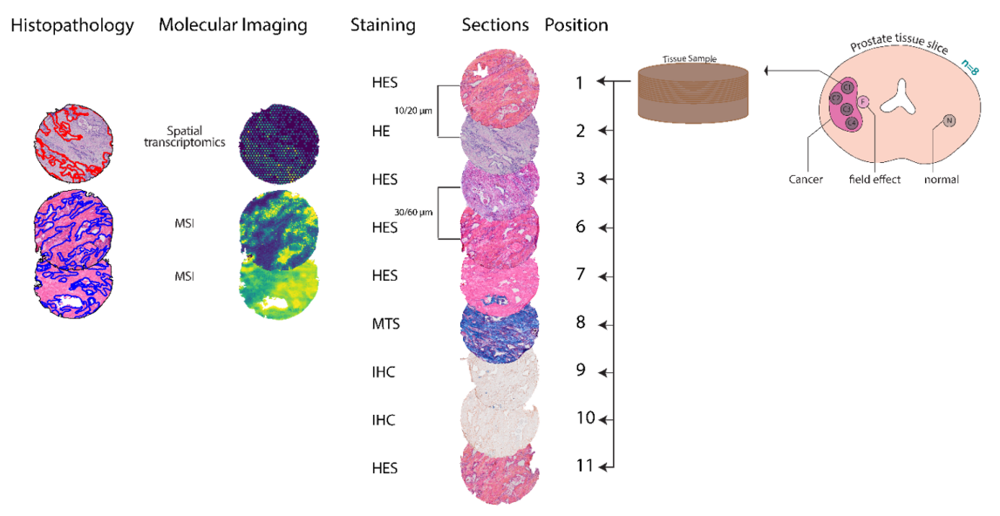

In [4]:
figure1 = cv2.imread(join(figure_directory, 'Figure1.png'))
figure1 = cv2.cvtColor(figure1, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
fig.tight_layout()
ax.axis('off')
ax.imshow(figure1)

In [5]:
# Set this option only to True, if greedy is used as an external docker image.
# If MIIT, GreedyFHist and Greedy are used from with the same docker container or if
# from no docker container at all, set this to False.

# Normally, this option can stay as False.
use_greedyfhist_from_external_docker_container = False

if use_greedyfhist_from_external_docker_container:
    path_to_greedy = 'mwess89/greedy:1.3.0-alpha'
    use_docker_container = True
else:
    path_to_greedy = 'greedy'
    use_docker_container = False
    

### 1.1. Loading data and plotting images, pointclouds and annotations.

In [6]:
sections = load_sections(section_directory, skip_so_data=True)

First we plot all the histology sections, landmarks and semi-manually generated tissue masks.

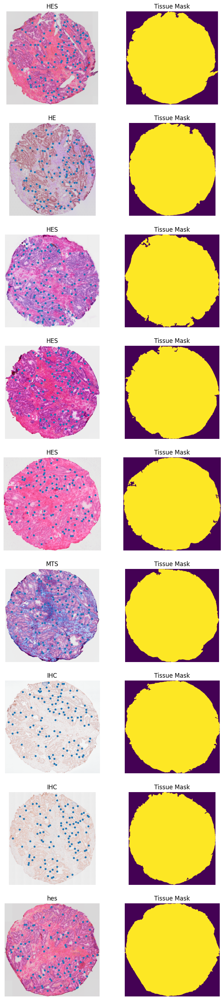

In [7]:
# Here we plot each histology image along with tissue masks and landmarks.
plot_sections(sections, image_scale=4)

Next, we show how annotations can be plotted. For that we chose annotations from section 6.

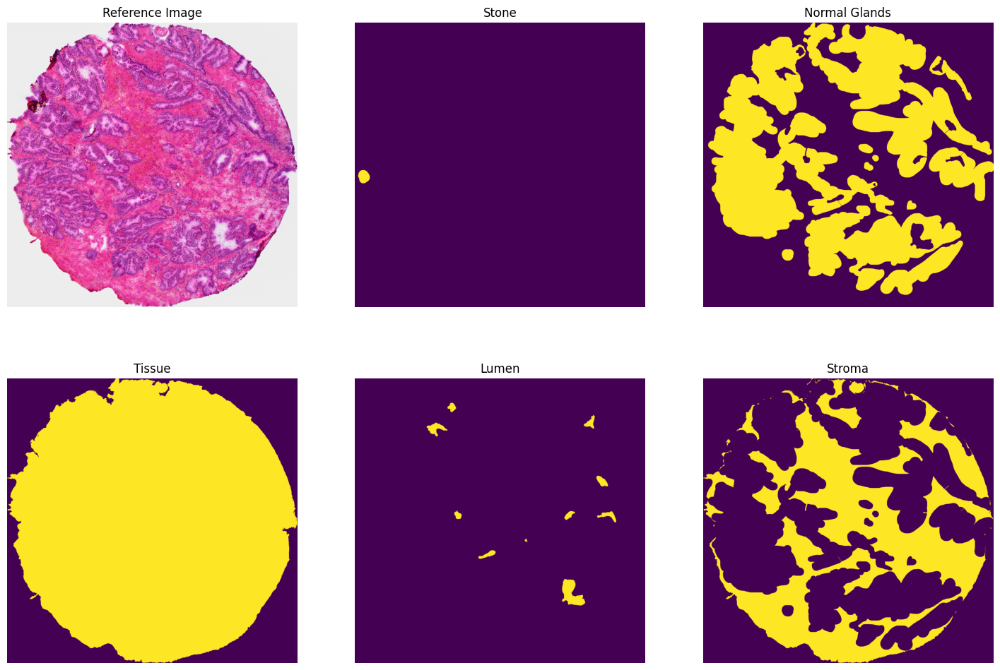

In [8]:
tc = sections['6'].get_annotations_by_names('tissue_classes')
tc.plot_annotation(reference_image=sections['6'].reference_image.data)

Now we can do the sample for annotations for section 7. The plot annotation method take a reference image as an optional input which can better help to interpret annotations.

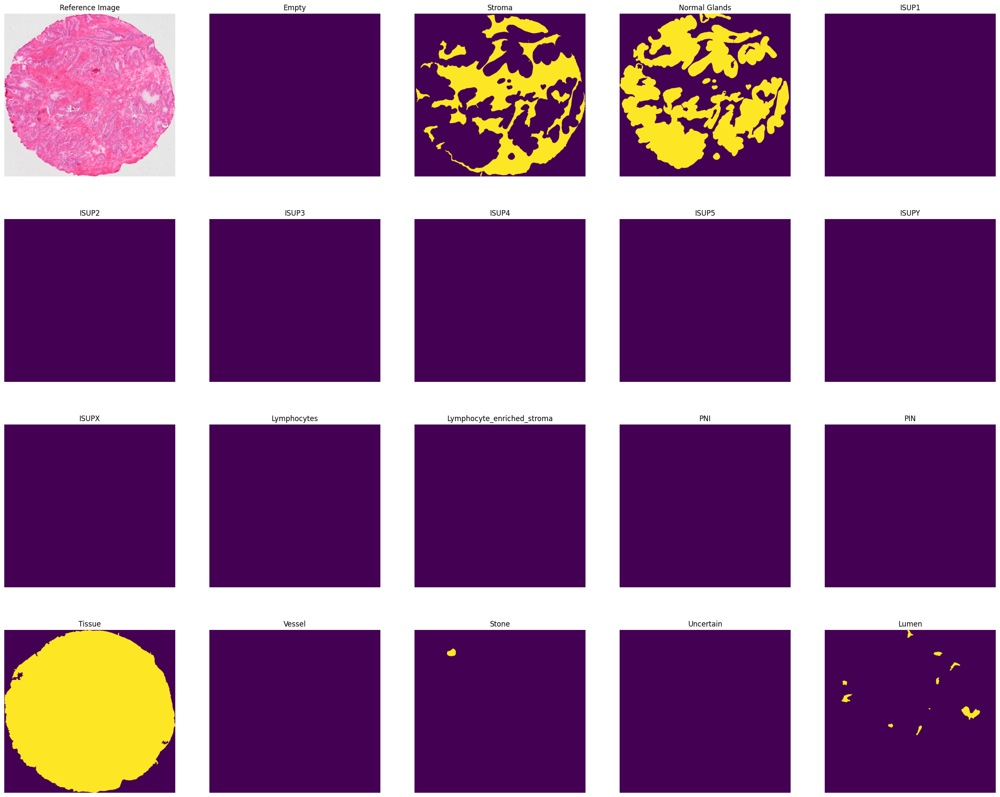

In [9]:
tc = sections['7'].get_annotations_by_names('tissue_classes')
tc.plot_annotation(reference_image=sections['7'].reference_image.data)

### 1.2. Data types - Loading spatial transcriptomics (`Visium`)

One of the two main types of spatial omics data is spatial transcriptomics. MIIT implements the `Visium` type from 10X Genomics. We show in a short example on how to load a `Visium` data and add it to a `Section` object. MIIT assumes that ST data has been preprocessed with `spaceranger`.

In [10]:
# We can load Visium by using the `from_spcrng` method and supploy to the output of spaceranger (i.e. normally named the `outs` directory.)
st = Visium.from_spcrng(join(section_directory, '2', 'spatial_transcriptomics'))

Text(0.5, 1.0, 'Histology section used for other processing.')

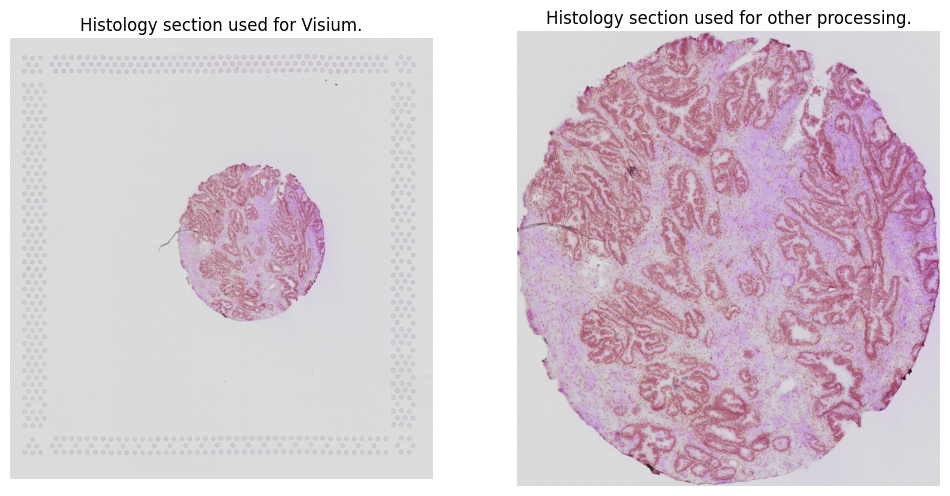

In [11]:
fig, axs = plt.subplots(1, 2, figsize=(6 * 2, 6 * 1))
for ax in axs:
    ax.axis('off')
axs[0].imshow(st.image.data)
axs[0].set_title('Histology section used for Visium.')
axs[1].imshow(sections['2'].reference_image.data)
axs[1].set_title('Histology section used for other processing.')

We can see, that the reference image we use and the histology image used for spatial transcriptomics are not exactly matching (i.e. one version is cropped).

This might happen occasionally and to solve this issue, we have a written a small helper function, `register_to_ref_image`.

`register_to_ref_image` works with any of MIIT's built-in types as the `data` argument.

In [12]:
warped_st_data, registered_st_image = register_to_ref_image(target_image=sections['2'].reference_image.data,
                                                            source_image=st.image.data,
                                                            data=st)

Text(0.5, 1.0, 'Registered Visium Histology')

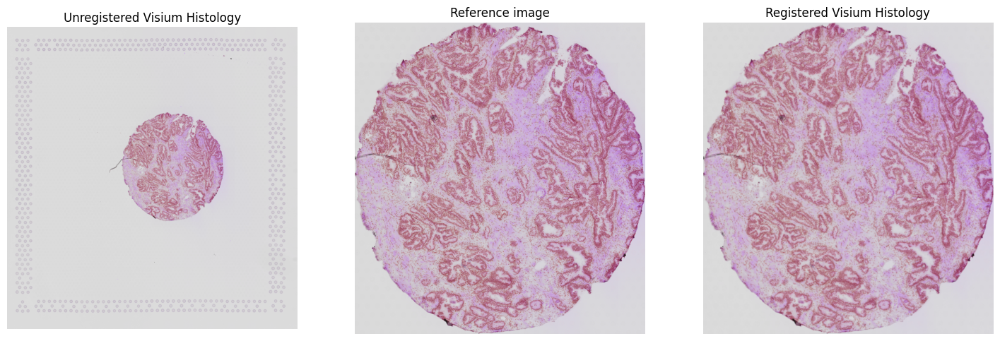

In [13]:
fig, axs = plt.subplots(1, 3, figsize=(6 * 3, 6 * 1))
for ax in axs:
    ax.axis('off')
axs[0].imshow(st.image.data)
axs[0].set_title('Unregistered Visium Histology')
axs[1].imshow(sections['2'].reference_image.data)
axs[1].set_title('Reference image')
axs[2].imshow(registered_st_image.data)
axs[2].set_title('Registered Visium Histology')

In [14]:
sections['2'].so_data.append(warped_st_data)

Section objects have a utility function to print all additional annotation and spatial omics data. Here we can see that section 2 has 3 additional entries:

One for annotation (tissue mask), one for pointset (landmarks) and one for visium data we just added.

In [15]:
sections['2'].print_additional_data_summary()

###################################################################
# Name        # ID                                   # Type       #
###################################################################
# tissue_mask # 38a222b4-f841-11ef-8dfb-fa163e1aeabd # annotation #
# landmarks   # 38a6772e-f841-11ef-8dfb-fa163e1aeabd # pointset   #
#             # 652047e4-f841-11ef-8dfb-fa163e1aeabd # visium     #
###################################################################


### 1.3. Data types - Loading imzml data.

The other important datatype in MIIT is Imzml data. We provide an initialization function, that loads msi data from imzml as well as support for the srd file format (from SCiLS).
Once an Imzml object is loaded it typically needs to be registered onto an histology image. Since MSI data is typically high dimensional an adequate image presentation needs to be derived. MIIT offers several ways to achieve this:

- PCA image derivation from the high dimensional msi spectrum. In this method the first principal component is used to generate an image.
- Ion images extracted from the MSI data and mapped onto image layout of the Imzml object.
- Additional annotations.

In the publication we used the PCA image method, but since this is a reduced dataset with only 1 resp. 2 mz values we show alternatives as well.


 and registers it to a reference image. By default, MIIT derives an image presentation from imzml data using the principal component analysis. If no accurate presentation can be derived from the msi data, alternatively srd annotation from Scils can also be used as a placeholder.

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


Text(0.5, 1.0, 'Region mask')

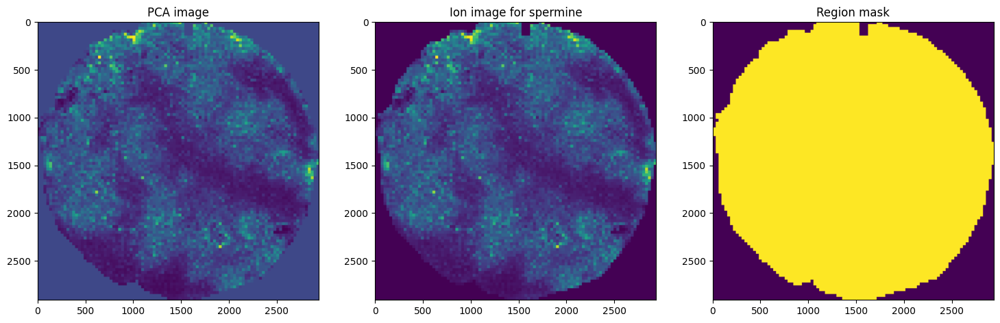

In [16]:
# Imzml

# Find paths
msi_pos_paths = glob.glob(join(section_directory, '6', 'imzml', '*'))
msi_pos_imzml_path = [x for x in msi_pos_paths if x.endswith('imzML')][0]
msi_pos_srd_path = [x for x in msi_pos_paths if x.endswith('srd')][0]
msi_pos_ibd_path = [x for x in msi_pos_paths if x.endswith('ibd')][0]
msi_pos_section = sections['6']

msi_pos = Imzml.init_msi_data(msi_pos_imzml_path, name='msi_pos', target_resolution=1)
srd_annotations = read_srd_with_msi(msi_pos_srd_path, msi_pos.msi, target_resolution=1)

pca_image = msi_pos.get_pca_img()

# We can either extract the ion image via index, which can be useful when dealing with preprocessed imzml files. Otherwise the method
# `extract_ion_image` can be used by supplying a range of mzs.
spermine_image = msi_pos.extract_ion_image_by_idx(0)

fig, axs = plt.subplots(1, 3, figsize=(18, 6))
axs[0].imshow(pca_image.data)
axs[0].set_title('PCA image')
axs[1].imshow(spermine_image.data)
axs[1].set_title('Ion image for spermine')
axs[2].imshow(srd_annotations[0].data)
axs[2].set_title('Region mask')


We see that the PCA image and the spermine image pretty much look the same which is expected as we only have intensity values for spermine. Though it is good to see that the method works robustly with little data.

Now, that we have an image presentation for the msi data, we need to register the msi data to the histology image. 

We provide a specific registration class for this task: `MSItoHistMetaRegisterer`. This class is sort of a META registerer as it does not perform registration itself, but 
applies preprocessing to the histology and msi image representation and then passes the preprocessed data along to a registration algorithm. By default, we use NiftyReg (https://github.com/KCL-BMEIS/niftyreg) for which we implemented a wrapper class. (NOTE: At the moment we have only implemented the rigid registration, other options will follow soon.)

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


Text(0.5, 1.0, 'Registered PCA image.')

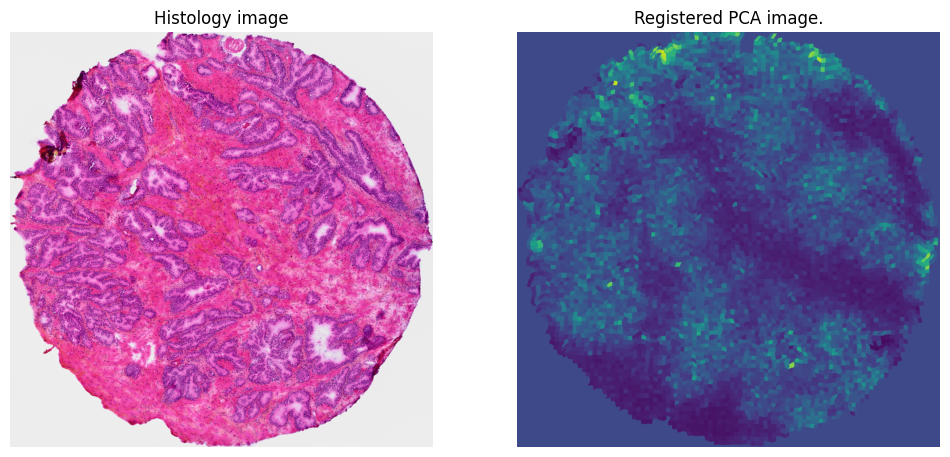

In [17]:
histology_image = sections['6'].reference_image

registerer = MSItoHistMetaRegisterer()
msi_reg_opts = {'nonrigid': False}


warped_msi_pos, warped_image = register_to_ref_image(histology_image.data, 
                                                     pca_image.data, 
                                                     msi_pos,
                                                     registerer=registerer,
                                                     reg_opts=msi_reg_opts)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
for ax in axs:
    ax.axis('off')
axs[0].imshow(histology_image.data)
axs[0].set_title('Histology image')
axs[1].imshow(warped_image.data)
axs[1].set_title('Registered PCA image.')


The registration looks successful and we can proceed to add the registered msi data to section 6.

In [18]:
sections['6'].so_data.append(warped_msi_pos)

In [19]:
sections['6'].print_additional_data_summary()

######################################################################
# Name           # ID                                   # Type       #
######################################################################
# tissue_mask    # 3923a776-f841-11ef-8dfb-fa163e1aeabd # annotation #
# landmarks      # 39282698-f841-11ef-8dfb-fa163e1aeabd # pointset   #
# tissue_classes # 39376928-f841-11ef-8dfb-fa163e1aeabd # annotation #
# msi_pos        # 9672180e-f841-11ef-8dfb-fa163e1aeabd # Imzml      #
######################################################################


We can also extract images of metabolites before integration and plot them.

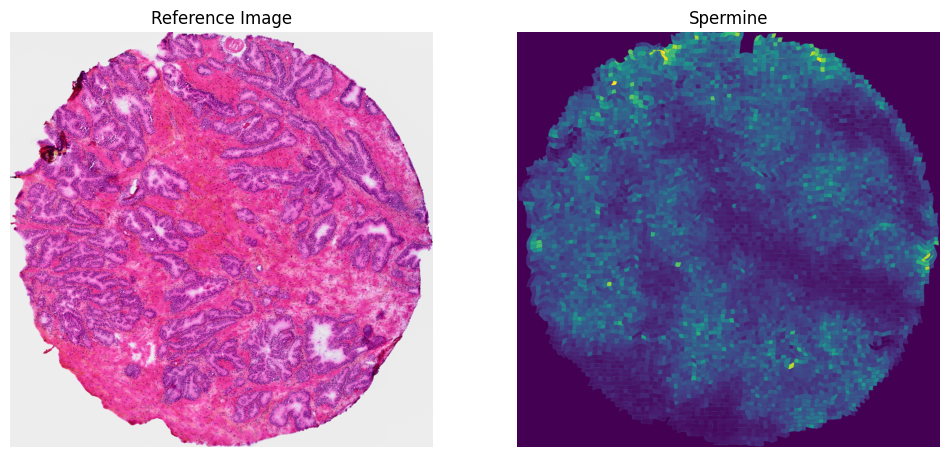

In [81]:
msi_pos_data = sections['6'].so_data[0]
msi_pixel_idxs = msi_pos_data.get_map_to_msi_pixel_idxs()

# Note that there are several ways of extracting metabolite intensities. In this instance, we have exported the imzml file such that only spermine is present.
metabolites_pos_df = get_metabolite_intensities_targeted(msi_pos_data.msi, msi_pixel_idxs, ['Spermine'])
pos_ion_images = msi_pos_data.to_ion_images(metabolites_pos_df)
pos_ion_images.plot_annotation(reference_image=sections['6'].reference_image.data)

Now we do the same thing again for the negative ion mode data on section 7.

Text(0.5, 1.0, 'Region mask')

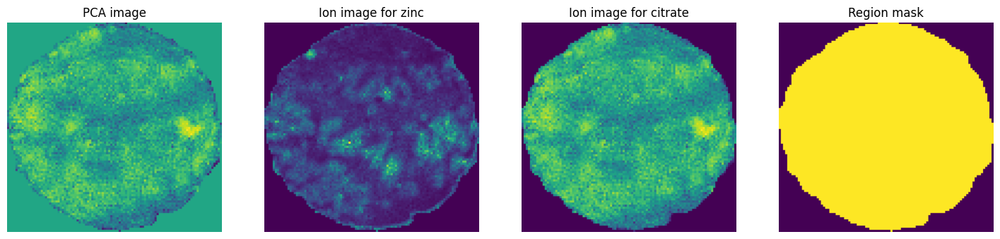

In [21]:
# Imzml
msi_neg_paths = glob.glob(join(section_directory, '7', 'imzml', '*'))
msi_neg_imzml_path = [x for x in msi_neg_paths if x.endswith('imzML')][0]
msi_neg_srd_path = [x for x in msi_neg_paths if x.endswith('srd')][0]
msi_neg_ibd_path = [x for x in msi_neg_paths if x.endswith('ibd')][0]
msi_neg_section = sections['7']

msi_neg = Imzml.init_msi_data(msi_neg_imzml_path, name='msi_neg', target_resolution=1)
srd_annotations = read_srd_with_msi(msi_neg_srd_path, msi_neg.msi, target_resolution=1)

pca_image = msi_neg.get_pca_img()

# We can either extract the ion image via index, which can be useful when dealing with preprocessed imzml files. Otherwise the method
# `extract_ion_image` can be used by supplying a range of mzs.
zinc_image = msi_neg.extract_ion_image_by_idx(0)
citrate_image = msi_neg.extract_ion_image_by_idx(1)

fig, axs = plt.subplots(1, 4, figsize=(18, 6))
for ax in axs:
    ax.axis('off')
axs[0].imshow(pca_image.data)
axs[0].set_title('PCA image')
axs[1].imshow(zinc_image.data)
axs[1].set_title('Ion image for zinc')
axs[2].imshow(citrate_image.data)
axs[2].set_title('Ion image for citrate')
axs[3].imshow(srd_annotations[0].data)
axs[3].set_title('Region mask')

This time we have 2 ion images. The PCA image seems to be most similar to citrate which is likely since citrate appears to have high intensities causing most of the variance in the msi data. We can continue by registering the the PCA image with the histology.

In [22]:
histology_image = sections['7'].reference_image

registerer = MSItoHistMetaRegisterer()
msi_reg_opts = {'nonrigid': False}

warped_msi_neg, warped_image = register_to_ref_image(histology_image.data, 
                                                     pca_image.data, 
                                                     msi_neg,
                                                     registerer=registerer,
                                                     reg_opts=msi_reg_opts)


/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


In [23]:
sections['7'].so_data.append(warped_msi_neg)
sections['7'].print_additional_data_summary()

######################################################################
# Name           # ID                                   # Type       #
######################################################################
# tissue_mask    # 39c814e6-f841-11ef-8dfb-fa163e1aeabd # annotation #
# landmarks      # 39d475ba-f841-11ef-8dfb-fa163e1aeabd # pointset   #
# tissue_classes # 3a2dbd8c-f841-11ef-8dfb-fa163e1aeabd # annotation #
# msi_neg        # c54ff5ce-f841-11ef-8dfb-fa163e1aeabd # Imzml      #
######################################################################


We quickly show that MIIT data can be stored and loaded again.

In [24]:
# Storing

for key in sections:
    section = sections[key]
    output_path = join(preprocessed_section_directory, key)
    section.store(output_path)

In [25]:
# Loading

sections = OrderedDict()
for sub_dir in os.listdir(preprocessed_section_directory):
    path = join(preprocessed_section_directory, sub_dir)
    section = Section.load(path)
    sections[sub_dir] = section

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


## 2. Registration

The next section deals with the topic of registration, an integral part of MIIT's spatial integration. MIIT comes with a variety of registration algorithms for different purposes, but for the registration of serial sections we use our own developed GreedyFHist algorithm (githum.com/mwess/greedyfhist). 

GreedyFHist can be used as a standalone tool or within MIIT. We will show examples for both applications.

In [26]:
# This function reloads all the from the previous chapter including st and msi data, so there is not need to run all the previous steps.
# If the previous steps have all been executed this cell can be skipped.
sections = load_sections(section_directory)

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


### 2.1. Option 1: Registration - GreedyFHist standalone

In [27]:
moving_section = sections['1']
fixed_section = sections['2']

moving_image = moving_section.reference_image.data
fixed_image = fixed_section.reference_image.data


# There is an option to use tissue_masks in GreedyFHist, though its typically necessary here.
use_manual_tissue_masks = False

if use_manual_tissue_masks:
    moving_img_mask = moving_section.get_annotations_by_names('tissue_mask').data
    fixed_img_mask = fixed_section.get_annotations_by_names('tissue_mask').data
else:
    moving_img_mask = None
    fixed_img_mask = None

# Get landmarks
moving_lms = moving_section.get_annotations_by_names('landmarks').data
fixed_lms = fixed_section.get_annotations_by_names('landmarks').data

options = RegistrationOptions()
# We achieved the fastest registration when setting n_threads to 8. 
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

GreedyFHist relies internally on the greedy tool. GreedyFHist can work with greedy either as an installed commandline application or as a docker executable. 

When greedy is installed as a commandline application, GreedyFHist needs the path to greedy. If greedy is on the PATH variable, no path needs to be provided. If greedy is used as a docker container executable, set path_to_greedy as the image name and set use_docker_container to True.

Note: If MIIT, GreedyFHist and greedy are all in a docker environment, path_to_greedy can be treated normally.

In [28]:
registerer = GreedyFHist(path_to_greedy=path_to_greedy, use_docker_container=use_docker_container)

In [29]:
registration_result = registerer.register(
    moving_img=moving_image,
    fixed_img=fixed_image,
    options=options
)

In [30]:
# We can use the computed registration_result to warp images to the fixed image space.
warped_image = registerer.transform_image(moving_image, registration_result.registration.forward_transform)

# We can also warp pointsets.
warped_lms = registerer.transform_pointset(moving_lms[['x', 'y']].to_numpy(), registration_result.registration.backward_transform)
warped_lms = pd.DataFrame(warped_lms, columns=['x', 'y'])
warped_lms['label'] = moving_lms['label'].copy()

We have a small utility function for comparing registrations and landmark distances

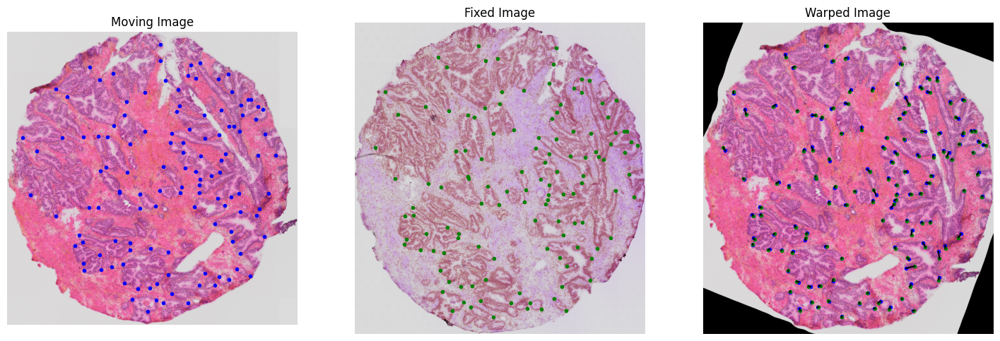

In [31]:
plot_registration_summary(moving_image,
                          fixed_image,
                          warped_image,
                          moving_lms,
                          fixed_lms,
                          warped_lms,
                          plot_lm_distance=True)

We also have a function to compute the registration accuracy based on the target-registration-error (tre). We also compute "relative tre" (rtre) based errors.

In [32]:
mean_rtre, median_rtre, mean_tre, median_tre = compute_tre(warped_lms, 
            fixed_lms,
            fixed_image.shape)
print(f'Mean rtre: {mean_rtre}')
print(f'Median rtre: {median_rtre}')
print(f'Mean tre: {mean_tre}')
print(f'Median tre: {median_tre}')

Mean rtre: 0.004441022398865141
Median rtre: 0.003500454291581626
Mean tre: 18.473801785775642
Median tre: 14.561218776868044


### 2.2 Option 2: Registration - Using GreedyFHist through MIIT

We could see in the last section, that warping one image and one set of landmarks already requires a few lines. With more data types this can be become increasingly cumbersome to keep track of. Therefor, we added wrapper classes for registration algorithms to MIIT, which connect registration algorithms directly to MIIT's datatypes. This makes it easier to handle a larger number of data types. 

In [33]:
# GreedyFHists wrapper class 'GreedyFHistExt' can be initialized with the same arguments as GreefyFHist.
gfh_ext = GreedyFHistExt.init_registerer(path_to_greedy=path_to_greedy,
                                         use_docker_container=use_docker_container)

In [34]:
# GreedyFHistExt can be called very similarly to GreedyFHist.

moving_section = sections['1']
fixed_section = sections['2']

options = RegistrationOptions()
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

registration_result = gfh_ext.register_images(moving_img=moving_section.reference_image.data,
                                              fixed_img=fixed_section.reference_image.data,
                                              options=options)

In [35]:
# After successful registration, we only need to pass, the registration_result and the associated
# registerer to the moving section and all data within the section is transformed to the fixed image space.
warped_section = moving_section.apply_transform(gfh_ext, registration_result)

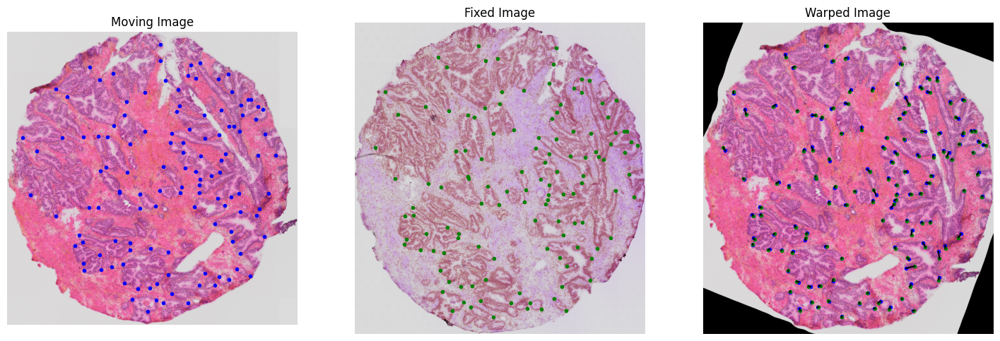

In [36]:
plot_registration_summary(
    moving_section.reference_image.data,
    fixed_section.reference_image.data,
    warped_section.reference_image.data,
    moving_section.get_annotations_by_names('landmarks').data,
    fixed_section.get_annotations_by_names('landmarks').data,
    warped_section.get_annotations_by_names('landmarks').data,
    plot_lm_distance=True
)

In [37]:
mean_rtre, median_rtre, mean_tre, median_tre = compute_tre(warped_section.get_annotations_by_names('landmarks').data, 
            fixed_section.get_annotations_by_names('landmarks').data,
            fixed_section.reference_image.data.shape)
print(f'Mean rtre: {mean_rtre}')
print(f'Median rtre: {median_rtre}')
print(f'Mean tre: {mean_tre}')
print(f'Median tre: {median_tre}')

Mean rtre: 0.004441022398865141
Median rtre: 0.003500454291581626
Mean tre: 18.473801785775642
Median tre: 14.561218776868044


## 2.3. Groupwise registration

GreedyFHist has a groupwise registration option that registers multiple images at once. We show here on how to use it in MIIT. 

At this moment, no other groupwise registration methods have been implented into MIIT.

In [38]:
options = RegistrationOptions()
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

# We invert the list, because the last section in the list is by convention the fixed section
# and in this example, we want section['2'] to be the fixed section.
section_list_ = [sections['7'], sections['6'], sections['2']]

warped_sections, transforms = groupwise_registration(section_list_, gfh_ext, options=options)

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


Text(0.5, 1.0, 'Fixed Image')

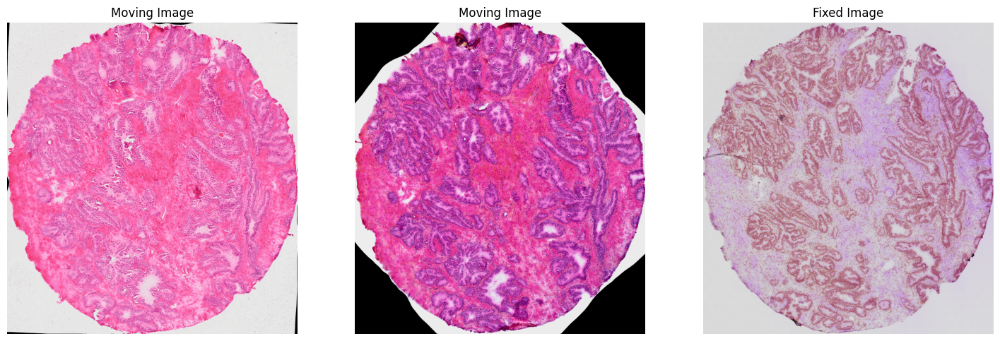

In [39]:
fig, axs = plt.subplots(1, len(warped_sections), figsize=(6 * len(warped_sections), 6 * 1))
for ax in axs:
    ax.axis('off')
for idx, section in enumerate(warped_sections[:-1]):
    axs[idx].imshow(warped_sections[idx].reference_image.data)
    axs[idx].set_title('Moving Image')
axs[-1].imshow(warped_sections[-1].reference_image.data)
axs[-1].set_title('Fixed Image')

In [40]:
st_section = warped_sections[2]
msi_pos_section = warped_sections[1]
msi_neg_section = warped_sections[0]

st_section.store(join(warped_section_directory, 'st_section'))
msi_pos_section.store(join(warped_section_directory, 'msi_pos_section'))
msi_neg_section.store(join(warped_section_directory, 'msi_neg_section'))

## 3. Transforming registered sections.

In this chapter, we show how to transform msi data and annotations to the topology of visium data.

The transformation consists of 3 separate steps: 
1. Computing the spatial mapping between msi and visium.
2. Extracting msi data.
3. Accumulating msi onto the the visium topology.

In [41]:
# YOU DO NOT NEED TO EXECUTE THIS STEP IF YOU HAVE PERFORMED THE GROUPWISE REGISTRATION AND STORED THE REGISTERED SECTIONS IN THE PREVIOUS CHAPTER.


# This is an optional step in which we register the imaging data necessary for the following integration.
# This step can also be skipped and the data can be loaded directly.
sections = load_sections(section_directory)

st_section = sections['2']
msi_pos_section = sections['6']
msi_neg_section = sections['7']


gfh_ext = GreedyFHistExt.init_registerer(path_to_greedy=path_to_greedy,
                                         use_docker_container=use_docker_container)

options = RegistrationOptions()
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

section_list_ = [sections['7'], sections['6'], sections['2']]

warped_sections, transforms = groupwise_registration(section_list_, gfh_ext, options=options)

st_section = warped_sections[2]
warped_msi_pos_section = warped_sections[1]
warped_msi_neg_section = warped_sections[0]

st_section.store(join(warped_section_directory, 'st_section'))
warped_msi_pos_section.store(join(warped_section_directory, 'msi_pos_section'))
warped_msi_neg_section.store(join(warped_section_directory, 'msi_neg_section'))

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel

In [42]:
# Load warped data
st_section = Section.load(join(warped_section_directory, 'st_section'))
msi_pos_section = Section.load(join(warped_section_directory, 'msi_pos_section'))
msi_neg_section = Section.load(join(warped_section_directory, 'msi_neg_section'))

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


### 3.1. Transforming MSI in positive ion mode to spatial transcriptomics data.

Step 1: Find overlap between reference matrix. By default, 0 is assumed to denote the background in each reference matrix. `get_mappings` returns:

- `mapping`: a dictionary that maps for every unique reference id in the source reference matrix, the reference ids (including counts) in the target reference matrix. 
- `spots_background`: for each unique id in the source reference matrix the amount of overlap with background noise in the target reference matrix.
- `unique_target_reference`: A list of unique target references that have overlap with the source reference ids. 

In [43]:
st_data = st_section.so_data[0]
msi_pos_data = msi_pos_section.so_data[0] 
mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_pos_data.ref_mat.data, st_data.background, msi_pos_data.background)

Step 2: We extract all intensities from the imzml file. We use the list unique references to only extract pixels which will be relevant for the subsequent merging. 
Row indices indicate the spectrum  and columns indices refer to the enumerated msi-pixels.

In [44]:
msi_pixel_idxs = msi_pos_data.set_map_to_msi_pixel_idxs(unique_target_reference)
msi_mappings = msi_pos_data.mappings_map_to_msi_pixel_idxs(mappings)
msi = ImzMLParser(msi_pos_data.config['imzml'])
metabolites_pos_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, ['Spermine'])
metabolites_pos_df.head()

,0,1,3,4,5,6,7,8,9,10,...,7336,7338,7341,7342,7343,7344,7350,7351,7352,7354
Spermine,7.188809,11.81903,8.22156,6.471012,6.866689,7.327454,12.053187,10.519325,9.508928,11.001272,...,41.835876,41.35804,48.114597,49.466747,48.110592,45.697506,44.901428,45.01685,22.8487,23.734386


Step 3: We use the msi data and overlapping areas to accumulate the counts over the shared spatial transcriptomics spots.

In this example, we compute the weighted mean to accumulate spots using `msi_default_accumulate_spot_weighted_mean`. 

In [45]:
accumulated_df = accumulate_counts(msi_mappings, metabolites_pos_df, spots_background, msi_default_accumulate_spot_weighted_mean)
integrated_pos_df = map_mapping_index_to_table_index(accumulated_df, st_data)
integrated_pos_df.head()

,Spermine
TAGCGTGAATTGGCGT-1,10.708562
TACTCTGTAGCATCGG-1,30.527565
GGCTAGTCAGGTAGGA-1,26.664401
CGTTAATCGAATTGCT-1,28.763245
ATATCCTGTCTATCGT-1,13.251501


### Step 3.2. Transforming MSI in negative ion mdoe to spatial transcriptomics.

In [46]:
# Transforming MSI in negative ion mode.

st_data = st_section.so_data[0]
msi_neg_data = msi_neg_section.so_data[0] 
mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_neg_data.ref_mat.data, st_data.background, msi_neg_data.background)

msi_pixel_idxs = msi_neg_data.set_map_to_msi_pixel_idxs(unique_target_reference)
msi_mappings = msi_neg_data.mappings_map_to_msi_pixel_idxs(mappings)
msi = ImzMLParser(msi_neg_data.config['imzml'])
metabolites_neg_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, ['Zinc', 'Citrate'])
accumulated_df = accumulate_counts(msi_mappings, metabolites_neg_df, spots_background, msi_default_accumulate_spot_weighted_mean)
msi_neg_df = map_mapping_index_to_table_index(accumulated_df, st_data)
msi_neg_df

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


,Zinc,Citrate
TAGCGTGAATTGGCGT-1,7.236332,261.290746
TACTCTGTAGCATCGG-1,5.155204,330.989589
GGCTAGTCAGGTAGGA-1,7.714553,353.061069
CGTTAATCGAATTGCT-1,10.207202,300.381557
ATATCCTGTCTATCGT-1,12.395050,332.230141
...,...,...
GACTGAGCTAGATCGC-1,4.781351,256.418092
ACAAAGGAGCCCAACT-1,2.883328,294.188039
GGGTCCATTGACCGCA-1,4.847049,337.009713
GCGCCCAATTACCTAG-1,5.567884,343.653264


### 3.3. Transforming annotations

MIIT can also be used to integration annotations over spatial omics data. The result returns for each unique datapoint in the spatial omics data a value between 0 and 1 to indicate how much area is covered by the given annotations.

In [47]:
msi_pos_integrated_annotations = transform_annotations_to_table(st_data, msi_pos_section.get_annotations_by_names('tissue_classes'))
msi_pos_integrated_annotations.head()

,Stone,Normal Glands,Tissue,Lumen,Stroma
TAGCGTGAATTGGCGT-1,0.0,0.071736,0.264347,0.0,0.192611
TACTCTGTAGCATCGG-1,0.0,0.935131,1.000000,0.0,0.064869
GGCTAGTCAGGTAGGA-1,0.0,1.000000,1.000000,0.0,0.000000
CGTTAATCGAATTGCT-1,0.0,0.342898,0.861908,0.0,0.519010
ATATCCTGTCTATCGT-1,0.0,1.000000,1.000000,0.0,0.000000


In [48]:
msi_neg_ann_df = transform_annotations_to_table(st_data, msi_neg_section.get_annotation_by_name('tissue_classes'))
msi_neg_ann_df.head()

,Empty,Stroma,Normal Glands,ISUP1,ISUP2,ISUP3,ISUP4,ISUP5,ISUPY,ISUPX,Lymphocytes,Lymphocyte_enriched_stroma,PNI,PIN,Tissue,Vessel,Stone,Uncertain,Lumen
TAGCGTGAATTGGCGT-1,0.0,0.000000,0.017575,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.917504,0.0,0.0,0.0,0.0
TACTCTGTAGCATCGG-1,0.0,0.000000,0.788994,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0
GGCTAGTCAGGTAGGA-1,0.0,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0
CGTTAATCGAATTGCT-1,0.0,0.294118,0.226327,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.846485,0.0,0.0,0.0,0.0
ATATCCTGTCTATCGT-1,0.0,0.370235,0.486804,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.960777,0.0,0.0,0.0,0.0


## 4. Export

Exporting integrated data is simple for integrated counts in the spatial transcriptomics image space and can be done using pandas. For an alternative in which data is exported as imzml data, please see the example section. 

In [49]:
msi_neg_df.to_csv(join(integrated_data_directory, 'msi_neg.csv'))
integrated_pos_df.to_csv(join(integrated_data_directory, 'msi_pos.csv'))
msi_pos_integrated_annotations.to_csv(join(integrated_data_directory, 'msi_pos_ann.csv'))
msi_neg_ann_df.to_csv(join(integrated_data_directory, 'msi_neg_ann.csv'))

## 5. Proof-Of-Concept Anlaysis

In this section, we provide some functionality to create images used in the article. First, the integrated data from the previous section is plotted. Then, "wrongly" registered data is created by rotation the ST section by 180 degrees. 

The first part of the analysis, generate plots similar to the ones seen in the publication.
The second part computes spearman correlation between CSGS and metabolites.

In [50]:
def assign_tissue_classes(df, tissue_class, filter_stroma_gland=True):
    df = df[df[tissue_class] > 0.8].drop(tissue_class, axis=1)
    df_classes = pd.DataFrame(df.idxmax(1))
    df_classes['barcode'] = df_classes.index
    df_classes.rename(columns={0: 'tissue_class'}, inplace=True)
    if filter_stroma_gland:
        df_classes = df_classes[df_classes['tissue_class'].isin(['gland', 'stroma'])]
    return df_classes

def transform_to_st_data(st_data, msi_data, labels):
    mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_data.ref_mat.data, st_data.background, msi_data.background)
    msi_pixel_idxs = msi_data.get_map_to_msi_pixel_idxs(unique_target_reference)
    msi_mappings = msi_data.mappings_map_to_msi_pixel_idxs(mappings)
    msi = ImzMLParser(msi_data.config['imzml'])
    metabolites_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, labels)
    accumulated_df = accumulate_counts(msi_mappings, metabolites_df, spots_background, msi_default_accumulate_spot_weighted_mean)
    integrated_df = map_ref_idxs_to_spec_idxs(accumulated_df, st_data)
    return integrated_df
    

### 5.1. Processing of integrated data

In [51]:
# Loading data

warped_st_section = Section.load(join(warped_section_directory, 'st_section'))
st_data = warped_st_section.so_data[0]

msi_neg_df = pd.read_csv(join(integrated_data_directory, 'msi_neg.csv'), index_col=0)
msi_pos_df = pd.read_csv(join(integrated_data_directory, 'msi_pos.csv'), index_col=0)

msi_pos_ann_df = pd.read_csv(join(integrated_data_directory, 'msi_pos_ann.csv'), index_col=0)
msi_neg_ann_df = pd.read_csv(join(integrated_data_directory, 'msi_neg_ann.csv'), index_col=0) 

csgs_df = pd.read_csv(join(section_directory, '2', 'spatial_transcriptomics', 'csgs.csv'), index_col=0)
csgs_df.loc[csgs_df.unified_hp_class == 'Non-cancer glands', 'unified_hp_class'] = 'Normal Glands'

In [52]:
# Selecting tissue type and merging with msi data

msi_pos_ann_df = msi_pos_ann_df[msi_pos_ann_df.Tissue > 0.8]
msi_pos_ann_df.drop(['Tissue'], axis=1, inplace=True)
msi_pos_ann_df = msi_pos_ann_df.idxmax(1)
matching_pos_idxs = msi_pos_df.index.intersection(msi_pos_ann_df.index).intersection(csgs_df.index)
msi_pos_ann_df = msi_pos_ann_df.loc[matching_pos_idxs]
msi_pos_df = msi_pos_df.loc[matching_pos_idxs]
msi_pos_df['msi_hist'] = msi_pos_ann_df

In [53]:
msi_neg_ann_df = msi_neg_ann_df[msi_neg_ann_df.Tissue > 0.8]
msi_neg_ann_df.drop(['Tissue', 'Empty'], axis=1, inplace=True)
msi_neg_ann_df = msi_neg_ann_df.idxmax(1)
matching_neg_idxs = msi_neg_df.index.intersection(msi_neg_ann_df.index).intersection(csgs_df.index)
msi_neg_ann_df = msi_neg_ann_df.loc[matching_neg_idxs]
msi_neg_df = msi_neg_df.loc[matching_neg_idxs]
msi_neg_df['msi_hist'] = msi_neg_ann_df

In [54]:
# Combining dataframe with msi data and dataframe with csgs signature score
st_msi_pos_intersection = csgs_df.index.intersection(msi_pos_df.index)
st_msi_pos_df = pd.concat([csgs_df.loc[st_msi_pos_intersection], msi_pos_df.loc[st_msi_pos_intersection]], axis=1)
st_msi_pos_df.head()

,unified_hp_class,CSGS,Spermine,msi_hist
TACTCTGTAGCATCGG-1,Normal Glands,155.521547,30.527565,Normal Glands
GGCTAGTCAGGTAGGA-1,Normal Glands,154.125285,26.664401,Normal Glands
CGTTAATCGAATTGCT-1,Normal Glands,192.372621,28.763245,Stroma
ATATCCTGTCTATCGT-1,Normal Glands,219.800895,13.251501,Normal Glands
ACCCAAAGAGAAAGGC-1,Normal Glands,287.231693,27.279420,Stroma


In [55]:
st_msi_neg_intersection = csgs_df.index.intersection(msi_neg_df.index)
st_msi_neg_df = pd.concat([csgs_df.loc[st_msi_neg_intersection], msi_neg_df.loc[st_msi_neg_intersection]], axis=1)
st_msi_neg_df.head()

,unified_hp_class,CSGS,Zinc,Citrate,msi_hist
TAGCGTGAATTGGCGT-1,Normal Glands,270.042677,7.236332,261.290746,Normal Glands
TACTCTGTAGCATCGG-1,Normal Glands,155.521547,5.155204,330.989589,Normal Glands
GGCTAGTCAGGTAGGA-1,Normal Glands,154.125285,7.714553,353.061069,Normal Glands
CGTTAATCGAATTGCT-1,Normal Glands,192.372621,10.207202,300.381557,Stroma
ATATCCTGTCTATCGT-1,Normal Glands,219.800895,12.395050,332.230141,Normal Glands


In [56]:
# Making artificially registered section by rotation correctly registered section by 180 degrees.
art_st_section = make_artificial_integration_section(warped_st_section)
art_st_data = art_st_section.so_data[0]

warped_msi_pos_section = Section.load(join(warped_section_directory, 'msi_pos_section'))
warped_msi_neg_section = Section.load(join(warped_section_directory, 'msi_neg_section'))


/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


In [57]:
# Transforming msi data onto artificial section.

art_st_msi_neg_df = transform_to_st_data(art_st_data, warped_msi_neg_section.so_data[0], ['Zinc', 'Citrate'])
art_st_msi_pos_df = transform_to_st_data(art_st_data, warped_msi_pos_section.so_data[0], ['Spermine'])

art_msi_neg_ann_df = transform_annotations_to_table(art_st_data, warped_msi_neg_section.get_annotation_by_name('tissue_classes'))
art_msi_pos_ann_df = transform_annotations_to_table(art_st_data, warped_msi_pos_section.get_annotation_by_name('tissue_classes'))

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


In [58]:
art_msi_pos_ann_df = art_msi_pos_ann_df[art_msi_pos_ann_df.Tissue > 0.8]
art_msi_pos_ann_df.drop(['Tissue'], axis=1, inplace=True)
art_msi_pos_ann_df = art_msi_pos_ann_df.idxmax(1)
matching_pos_idxs = art_st_msi_pos_df.index.intersection(art_msi_pos_ann_df.index).intersection(csgs_df.index)
art_msi_pos_ann_df = art_msi_pos_ann_df.loc[matching_pos_idxs]
art_st_msi_pos_df = art_st_msi_pos_df.loc[matching_pos_idxs]
art_st_msi_pos_df['msi_hist'] = art_msi_pos_ann_df

In [59]:
art_msi_neg_ann_df = art_msi_neg_ann_df[art_msi_neg_ann_df.Tissue > 0.8]
art_msi_neg_ann_df.drop(['Tissue', 'Empty'], axis=1, inplace=True)
art_msi_neg_ann_df = art_msi_neg_ann_df.idxmax(1)
matching_neg_idxs = art_st_msi_neg_df.index.intersection(art_msi_neg_ann_df.index).intersection(csgs_df.index)
art_msi_neg_ann_df = art_msi_neg_ann_df.loc[matching_neg_idxs]
art_st_msi_neg_df = art_st_msi_neg_df.loc[matching_neg_idxs]
art_st_msi_neg_df['msi_hist'] = art_msi_neg_ann_df


In [60]:
art_st_msi_pos_intersection = csgs_df.index.intersection(art_st_msi_pos_df.index)
art_st_msi_pos_df = pd.concat([csgs_df.loc[art_st_msi_pos_intersection], art_st_msi_pos_df.loc[art_st_msi_pos_intersection]], axis=1)
art_st_msi_pos_df.head()

,unified_hp_class,CSGS,Spermine,msi_hist
TACTCTGTAGCATCGG-1,Normal Glands,155.521547,14.778855,Stroma
GGCTAGTCAGGTAGGA-1,Normal Glands,154.125285,20.801890,Normal Glands
CGTTAATCGAATTGCT-1,Normal Glands,192.372621,32.428289,Normal Glands
ATATCCTGTCTATCGT-1,Normal Glands,219.800895,27.997344,Normal Glands
ACCCAAAGAGAAAGGC-1,Normal Glands,287.231693,22.129944,Normal Glands


In [61]:
art_st_msi_neg_intersection = csgs_df.index.intersection(art_st_msi_neg_df.index)
art_st_msi_neg_df = pd.concat([csgs_df.loc[art_st_msi_neg_intersection], art_st_msi_neg_df.loc[art_st_msi_neg_intersection]], axis=1)
art_st_msi_neg_df.head()

,unified_hp_class,CSGS,Zinc,Citrate,msi_hist
TACTCTGTAGCATCGG-1,Normal Glands,155.521547,5.335040,304.941024,Stroma
GGCTAGTCAGGTAGGA-1,Normal Glands,154.125285,4.161137,242.226518,Normal Glands
CGTTAATCGAATTGCT-1,Normal Glands,192.372621,6.018540,352.271477,Normal Glands
ATATCCTGTCTATCGT-1,Normal Glands,219.800895,5.609013,306.820487,Normal Glands
ACCCAAAGAGAAAGGC-1,Normal Glands,287.231693,7.984146,324.624040,Stroma


In [62]:
# Getting dataframes with matched tisseu types
matching_st_msi_neg_df = st_msi_neg_df[st_msi_neg_df.unified_hp_class == st_msi_neg_df.msi_hist]
matching_st_msi_pos_df = st_msi_pos_df[st_msi_pos_df.unified_hp_class == st_msi_pos_df.msi_hist]
matching_art_st_msi_neg_df = art_st_msi_neg_df[art_st_msi_neg_df.unified_hp_class == art_st_msi_neg_df.msi_hist]
matching_art_st_msi_pos_df = art_st_msi_pos_df[art_st_msi_pos_df.unified_hp_class == art_st_msi_pos_df.msi_hist]

### 5.2. Plotting spot comparison image

Plots the spot comparison image from Figure 6a.

In [63]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def get_alpha(img):
    alpha_mask = np.zeros_like(img)
    alpha_mask[img != 0] = 1
    return alpha_mask

def get_vmin_vmax(mat, lower=0.025, upper=0.85):
    vmin = np.quantile(mat[mat != 0], lower)
    vmax = np.quantile(mat[mat != 0], upper)
    return vmin, vmax

def plot_mat_as_img(fmat, ax, do_legend=False, vminmax=None):
    background_img = np.ones((fmat.shape[0], fmat.shape[1], 3))
    mask = get_alpha(fmat)
    if vminmax is None:
        vmin, vmax = get_vmin_vmax(fmat)
    else:
        vmin, vmax = vminmax
    ax.imshow(background_img)
    im = ax.imshow(fmat, alpha=mask, vmin=vmin, vmax=vmax)
    if do_legend:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("top", size="5%", pad=0.05)
        cbar = ax.figure.colorbar(im, cax=cax, location="top")

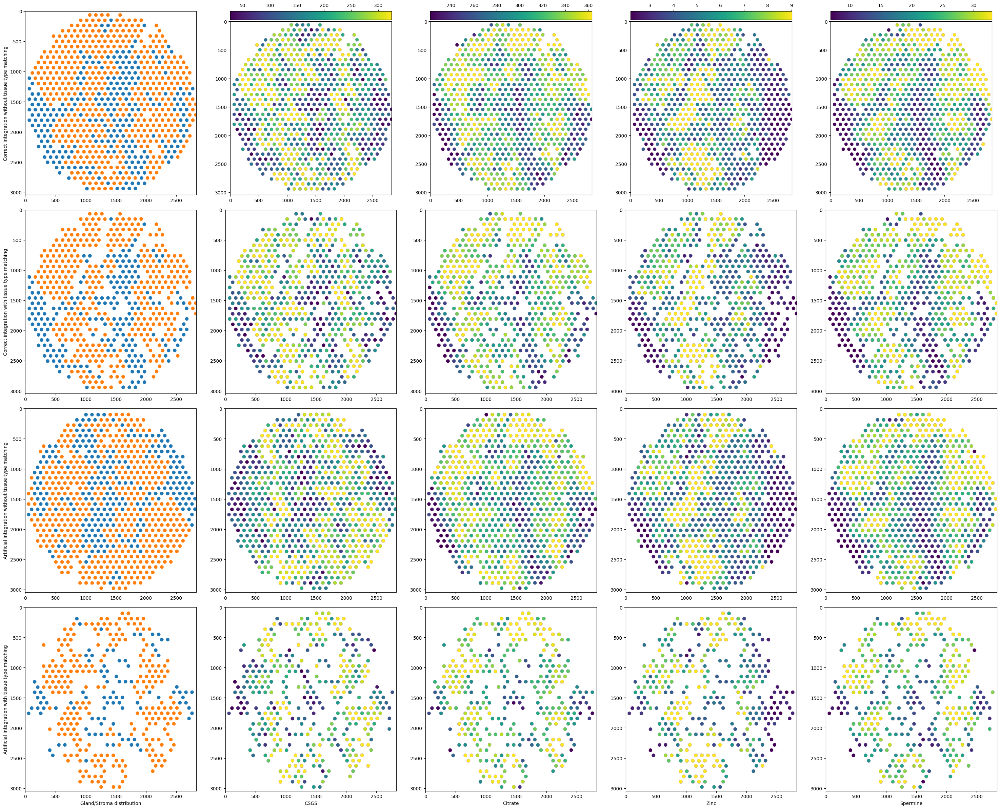

In [64]:
do_legend = True


gs_img = get_spot_coloring_img(
    st_msi_neg_df,
    st_data.ref_mat.data,
    st_data.table.data,
    gland='Normal Glands',
    stroma='Stroma'
)


matching_gs_img = get_spot_coloring_img(
    matching_st_msi_neg_df,
    st_data.ref_mat.data,
    st_data.table.data,
    gland='Normal Glands',
    stroma='Stroma'
)


art_gs_img = get_spot_coloring_img(
    art_st_msi_neg_df,
    art_st_data.ref_mat.data,
    art_st_data.table.data,
    gland='Normal Glands',
    stroma='Stroma'
)


matching_art_gs_img = get_spot_coloring_img(
    matching_art_st_msi_neg_df,
    art_st_data.ref_mat.data,
    art_st_data.table.data,
    gland='Normal Glands',
    stroma='Stroma'
)

non_matching_csgs_mat = convert_table_to_mat(st_msi_neg_df, st_data, 'CSGS')
matching_csgs_mat = convert_table_to_mat(matching_st_msi_pos_df, st_data, 'CSGS')

art_non_matching_csgs_mat = convert_table_to_mat(art_st_msi_pos_df, art_st_data, 'CSGS')
art_matching_csgs_mat = convert_table_to_mat(matching_art_st_msi_pos_df, art_st_data, 'CSGS')

non_matching_spermine_mat = convert_table_to_mat(st_msi_pos_df, st_data, 'Spermine')
matching_spermine_mat = convert_table_to_mat(matching_st_msi_pos_df, st_data, 'Spermine')

art_non_matching_spermine_mat = convert_table_to_mat(art_st_msi_pos_df, art_st_data, 'Spermine')
art_matching_spermine_mat = convert_table_to_mat(matching_art_st_msi_pos_df, art_st_data, 'Spermine')

non_matching_citrate_mat = convert_table_to_mat(st_msi_neg_df, st_data, 'Citrate')
matching_citrate_mat = convert_table_to_mat(matching_st_msi_neg_df, st_data, 'Citrate')

art_non_matching_citrate_mat = convert_table_to_mat(art_st_msi_neg_df, art_st_data, 'Citrate')
art_matching_citrate_mat = convert_table_to_mat(matching_art_st_msi_neg_df, art_st_data, 'Citrate')

non_matching_zinc_mat = convert_table_to_mat(st_msi_neg_df, st_data, 'Zinc')
matching_zinc_mat = convert_table_to_mat(matching_st_msi_neg_df, st_data, 'Zinc')

art_non_matching_zinc_mat = convert_table_to_mat(art_st_msi_neg_df, art_st_data, 'Zinc')
art_matching_zinc_mat = convert_table_to_mat(matching_art_st_msi_neg_df, art_st_data, 'Zinc')


fig, axs = plt.subplots(4, 5, figsize=(6 * 5, 6 * 4))
# for i in range(axs.shape[0]):
#     for j in range(axs.shape[1]):
#         axs[i,j].axis('off')


axs[0, 0].imshow(gs_img)
axs[0, 0].set_ylabel('Correct integration without tissue type matching')
axs[1, 0].imshow(matching_gs_img)
axs[1, 0].set_ylabel('Correct integration with tissue type matching')
axs[2, 0].imshow(art_gs_img)
axs[2, 0].set_ylabel('Artificial integration without tissue type matching')
axs[3, 0].imshow(matching_art_gs_img)
axs[3, 0].set_ylabel('Artificial integration with tissue type matching')

vmin, vmax = get_vmin_vmax(np.dstack([non_matching_csgs_mat, matching_csgs_mat, art_non_matching_csgs_mat, art_matching_csgs_mat]))


plot_mat_as_img(non_matching_csgs_mat, axs[0,1], vminmax=(vmin, vmax), do_legend=do_legend)
plot_mat_as_img(matching_csgs_mat, axs[1,1], vminmax=(vmin, vmax))
plot_mat_as_img(art_non_matching_csgs_mat, axs[2,1], vminmax=(vmin, vmax))
plot_mat_as_img(art_matching_csgs_mat, axs[3,1], vminmax=(vmin, vmax))

vmin, vmax = get_vmin_vmax(np.dstack([matching_citrate_mat, non_matching_citrate_mat, art_matching_citrate_mat, art_non_matching_citrate_mat]))

plot_mat_as_img(non_matching_citrate_mat, axs[0,2], vminmax=(vmin, vmax), do_legend=do_legend)
plot_mat_as_img(matching_citrate_mat, axs[1,2], vminmax=(vmin, vmax))
plot_mat_as_img(art_non_matching_citrate_mat, axs[2,2], vminmax=(vmin, vmax))
plot_mat_as_img(art_matching_citrate_mat, axs[3,2], vminmax=(vmin, vmax))

vmin, vmax = get_vmin_vmax(np.dstack([non_matching_zinc_mat, matching_zinc_mat, art_non_matching_zinc_mat, art_matching_zinc_mat]))

plot_mat_as_img(non_matching_zinc_mat, axs[0,3], vminmax=(vmin, vmax), do_legend=do_legend)
plot_mat_as_img(matching_zinc_mat, axs[1,3], vminmax=(vmin, vmax))
plot_mat_as_img(art_non_matching_zinc_mat, axs[2,3], vminmax=(vmin, vmax))
plot_mat_as_img(art_matching_zinc_mat, axs[3,3], vminmax=(vmin, vmax))

vmin, vmax = get_vmin_vmax(np.dstack([non_matching_spermine_mat, matching_spermine_mat, art_non_matching_spermine_mat, art_matching_spermine_mat]))

plot_mat_as_img(non_matching_spermine_mat, axs[0,4], vminmax=(vmin, vmax), do_legend=do_legend)
plot_mat_as_img(matching_spermine_mat, axs[1,4], vminmax=(vmin, vmax))
plot_mat_as_img(art_non_matching_spermine_mat, axs[2,4], vminmax=(vmin, vmax))
plot_mat_as_img(art_matching_spermine_mat, axs[3,4], vminmax=(vmin, vmax))

axs[3, 0].set_xlabel('Gland/Stroma distribution')
axs[3, 1].set_xlabel('CSGS')
axs[3, 2].set_xlabel('Citrate')
axs[3, 3].set_xlabel('Zinc')
axs[3, 4].set_xlabel('Spermine')

fig.tight_layout()

### 5.3. Plotting scatter plot from Figure 5.

In [65]:
import scipy

# Function for setting length labels.
from collections import Counter

def set_decimal_length_of_tick_label(text, dec_len):
    t = text.get_text()
    if '.' not in t:
        return t
    pref = len(t.split('.')[0])
    return t[:(pref + 1 + dec_len)]

def set_decimal_length_of_tick_labels(tick_labels, dec_len):
    return map(lambda x: set_decimal_length_of_tick_label(x, dec_len), tick_labels)


/mnt/scratch/tmp/ipykernel_3958372/3083906300.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), size=tick_fontsize)
/mnt/scratch/tmp/ipykernel_3958372/3083906300.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), size=tick_fontsize)
/mnt/scratch/tmp/ipykernel_3958372/3083906300.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), size=tick_fontsize)
/mnt/scratch/tmp/ipykernel_3958372/3083906300.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(set_decimal_length_of_tick_labels(ax.get_yticklabels(), 1))
/mnt/scratch/tmp/ipyk

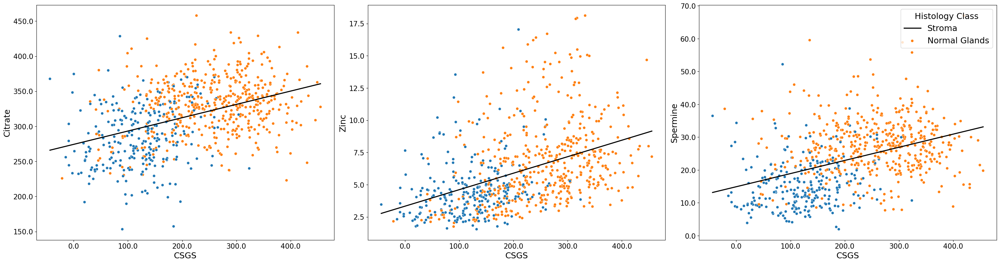

In [66]:
import seaborn as sns

fontsize=18
tick_fontsize=15
standard_color = sns.color_palette()
color_mapping = {}
color_mapping['Stroma'] = standard_color[0]
color_mapping['Normal Glands'] = standard_color[1]    

fig, axs = plt.subplots(1, 3, figsize=(30, 8))
ax = sns.regplot(data=st_msi_neg_df, x='CSGS', y='Citrate', ax=axs[0], scatter=False, line_kws={"color": "black"}, ci=None)
ax = sns.scatterplot(data=st_msi_neg_df, x='CSGS', y='Citrate', hue='unified_hp_class', palette=color_mapping, ax=ax)
ax.set_xlabel('CSGS', fontsize=fontsize)
ax.set_ylabel('Citrate', fontsize=fontsize)
ax.set_yticklabels(ax.get_yticks(), size=tick_fontsize)
ax.set_xticklabels(ax.get_xticks(), size=tick_fontsize)
ax.legend([],[], frameon=False)
ax = sns.regplot(data=st_msi_neg_df, x='CSGS', y='Zinc', ax=axs[1], scatter=False, line_kws={"color": "black"}, ci=None)
ax = sns.scatterplot(data=st_msi_neg_df, x='CSGS', y='Zinc', hue='unified_hp_class', palette=color_mapping, ax=ax)
ax.set_xlabel('CSGS', fontsize=fontsize)
ax.set_ylabel('Zinc', fontsize=fontsize)
ax.set_yticklabels(ax.get_yticks(), size=tick_fontsize)
ax.set_yticklabels(set_decimal_length_of_tick_labels(ax.get_yticklabels(), 1))
ax.set_xticklabels(ax.get_xticks(), size=tick_fontsize)
ax.set_xticklabels(set_decimal_length_of_tick_labels(ax.get_xticklabels(), 1))
ax.legend([],[], frameon=False)
ax = sns.regplot(data=st_msi_pos_df, x='CSGS', y='Spermine', ax=axs[2], scatter=False, line_kws={"color": "black"}, ci=None)
ax = sns.scatterplot(data=st_msi_pos_df, x='CSGS', y='Spermine', hue='unified_hp_class', palette=color_mapping, ax=ax)
ax.set_xlabel('CSGS', fontsize=fontsize)
ax.set_ylabel('Spermine', fontsize=fontsize)
ax.set_yticklabels(ax.get_yticks(), size=tick_fontsize)
ax.set_xticklabels(ax.get_xticks(), size=tick_fontsize)
ax.legend(title='Histology Class', labels=['Stroma', 'Normal Glands'])
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
sns.move_legend(ax, "upper right", fontsize=fontsize, title_fontsize=fontsize)
fig.tight_layout()

I know that there is a wrong legend in the upper right corner.

### 5.4. Correlations

In the last part, we compute the correlations between CSGS and spermine, citrate and zinc. In the previous section, we compute matching tissue types between all 3 sections for easier visualization. However, since MALDI-TOF MSI was applied to different sections to capture the correlations more accurate, we will match tissue types separately for the ST section and the MSI-POS section, resp. MSI-NEG section.


Reminder: The metabolite data was slighly obfuscated, potentially leading to slightly different values than the ones used in the original article.

In [67]:
from scipy.stats import spearmanr

#### Correlation between CSGS and Citrate, Spermine and Zinc for matching tissue types between registered serial sections.

In [68]:
spearmanr(matching_st_msi_neg_df['CSGS'], matching_st_msi_neg_df['Citrate'])

SignificanceResult(statistic=0.49871074052920766, pvalue=3.580175961568472e-38)

In [69]:
spearmanr(matching_st_msi_neg_df['CSGS'], matching_st_msi_neg_df['Zinc'])

SignificanceResult(statistic=0.5746255655297406, pvalue=8.60374652986141e-53)

In [70]:
spearmanr(matching_st_msi_pos_df['CSGS'], matching_st_msi_pos_df['Spermine'])

SignificanceResult(statistic=0.5051099220015368, pvalue=3.123387844536096e-40)

#### Correlation between CSGS and Citrate, Spermine and Zinc ignoring tissue types between registered serial sections.

In [71]:
spearmanr(st_msi_neg_df['CSGS'], st_msi_neg_df['Citrate'])

SignificanceResult(statistic=0.4239702177297307, pvalue=3.6335004173482866e-33)

In [72]:
spearmanr(st_msi_neg_df['CSGS'], st_msi_neg_df['Zinc'])

SignificanceResult(statistic=0.4990151767168511, pvalue=3.6547207770279136e-47)

In [73]:
spearmanr(st_msi_pos_df['CSGS'], st_msi_pos_df['Spermine'])

SignificanceResult(statistic=0.4533730629238068, pvalue=6.900834200119709e-38)

#### Correlation between CSGS and Citrate, Spermine and Zinc for matching tissue types for "artificially" registered serial sections.

In [74]:
spearmanr(matching_art_st_msi_neg_df['CSGS'], matching_art_st_msi_neg_df['Citrate'])

SignificanceResult(statistic=0.2760009935941168, pvalue=1.5434043413892725e-07)

In [75]:
spearmanr(matching_art_st_msi_neg_df['CSGS'], matching_art_st_msi_neg_df['Zinc'])

SignificanceResult(statistic=0.20837417914781814, pvalue=8.580658848122226e-05)

In [76]:
spearmanr(matching_art_st_msi_pos_df['CSGS'], matching_art_st_msi_pos_df['Spermine'])

SignificanceResult(statistic=0.32532423737536337, pvalue=1.3580454696696962e-10)

#### Correlation between CSGS and Citrate, Spermine and Zinc ignoring tissue types for "artificially" registered serial sections.

In [77]:
spearmanr(art_st_msi_neg_df['CSGS'], art_st_msi_neg_df['Citrate'])

SignificanceResult(statistic=0.033364827745373256, pvalue=0.3730121497028299)

In [78]:
spearmanr(art_st_msi_neg_df['CSGS'], art_st_msi_neg_df['Zinc'])

SignificanceResult(statistic=0.03252012529041776, pvalue=0.3852413008601723)

In [79]:
spearmanr(art_st_msi_pos_df['CSGS'], art_st_msi_pos_df['Spermine'])

SignificanceResult(statistic=0.05504886175277237, pvalue=0.1414215507946802)